Adam Peetz<br>
September 11th 2022<br>
MSDS680 Week 3 Assignment<br>
Regis University<br>
Professor Nasheb Ismaily<br>

# Detecting Email Spam with Naive Bayes

The ease and anonymity of digital communication makes it easy for corporations and bad actors to send and receive unwanted messages. These messages come in many forms. They might be announcements of contest wins to fish for personal information. Or low-cost advertisements encouraging the reader to buy a product. There are even antivirus warnings that really install viruses. According to statista.com, as much as 60% of the total volume of email is spam. While people are trained to identify and avoid engaging with spam, the best solution to the problem is to create filters that prevent users from being exposed to it in the first place. Upfront filtering of spam emails protects the time and security of people who use email or SMS communication systems. <br>

There are commonalities in the words used in spam and legitimate messages. For example, a message containing the word "Viagra" is most likely spam. This commonality among messages makes it possible for spam to be identified by machine learning algorithms. <br>

One of the earliest algorithmic detection methods for spam email employs a probabilistic algorithm called Naive Bayes. Naive Bayes algorithms were used for spam detection as early as the 90's. A Naive Bayes algorithm can detect spam by assigning a probability for spam or legitimacy to each word in a message. The product of the probabilities for all the words in a message is calculculated and used to determine a message's legitimacy. Naive Bayes algorithms are an excellent choice for spam filtering, they work well with large datasets, and are fast enough to make real time predictions which is essential in communication applications that rely on speed.<br>

An approach for implementing Naive Bayes for spam filtering with a dataset from Almeida et al. (2011) is shown in the code below.


In [1]:
# import required libraries
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import numpy as np
import nltk
from nltk.corpus import stopwords
from sklearn.preprocessing import LabelEncoder 
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import train_test_split
nltk.download('omw-1.4')
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.ensemble import RandomForestClassifier

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\adamg\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [2]:
# define the confusion matrix function, from the sklearn documentation
# defining at start of notebook to improve visual flow later in the code
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [3]:
#import dataset
spam_df = pd.read_csv('assign_wk3/spam.csv', sep=',',encoding='latin-1')

# Preparing the Text for Machine Learning

Raw strings of text cannot be processed by machine learning algorithms. They must be cleaned and vectorized before they can be used for ML.

## Dealing with Excess Columns

The Almeida et al. (2011) dataset contains 5 features. v1 is the prediction target for spam or ham. v2 contains the message content. There are also 3 "unnamed" features in the dataset. When explored, these unnamed columns appear to contain additional message content that was not included in the v2 feature. The content in the unnamed features might be meaningful to the prediction of spam or ham. Rather than discard this information, it will be concatenated to the v2 feature and included in the prediction analysis. The unnamed features will be dropped from the dataset after concatenation to the v2 feature.


In [4]:
#sample DF
spam_df.head()

,v1,v2,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,ham,"Go until jurong point, crazy.. Available only ...",NaN,NaN,NaN
1,ham,Ok lar... Joking wif u oni...,NaN,NaN,NaN
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,NaN,NaN,NaN
3,ham,U dun say so early hor... U c already then say...,NaN,NaN,NaN
4,ham,"Nah I don't think he goes to usf, he lives aro...",NaN,NaN,NaN


In [5]:
#explore NaN content
spam_df.loc[spam_df['Unnamed: 2'].notnull()]

,v1,v2,Unnamed: 2,Unnamed: 3,Unnamed: 4
95,spam,Your free ringtone is waiting to be collected....,PO Box 5249,"MK17 92H. 450Ppw 16""",NaN
281,ham,\Wen u miss someone,the person is definitely special for u..... B...,why to miss them,"just Keep-in-touch\"" gdeve.."""
444,ham,\HEY HEY WERETHE MONKEESPEOPLE SAY WE MONKEYAR...,HOWU DOIN? FOUNDURSELF A JOBYET SAUSAGE?LOVE ...,NaN,NaN
671,spam,SMS. ac sun0819 posts HELLO:\You seem cool,"wanted to say hi. HI!!!\"" Stop? Send STOP to ...",NaN,NaN
710,ham,Height of Confidence: All the Aeronautics prof...,"this wont even start........ Datz confidence..""",NaN,NaN
899,spam,Your free ringtone is waiting to be collected....,PO Box 5249,"MK17 92H. 450Ppw 16""",NaN
1038,ham,"Edison has rightly said, \A fool can ask more ...",GN,GE,"GNT:-)"""
1127,ham,"Height of \Oh shit....!!\"" situation: A guy th...",".;-):-D""",NaN,NaN
1266,ham,\Hey sorry I didntgive ya a a bellearlier hunny,just been in bedbut mite go 2 thepub l8tr if u...,NaN,NaN
1384,ham,"Storming msg: Wen u lift d phne, u say \HELLO\...","bt not his girlfrnd... G o o d n i g h t . . .@""",NaN,NaN


In [6]:
#replace NaN with blanks
spam_df.fillna(' ', inplace=True)

#concatenate all columns to new 'text' column
spam_df['text']=spam_df['v2']+spam_df['Unnamed: 2'].astype(str)+spam_df['Unnamed: 3'].astype(str) \
                    +spam_df['Unnamed: 4'].astype(str)

In [7]:
#drop unneeded columns
spam_df.drop(labels=['v2','Unnamed: 2','Unnamed: 3','Unnamed: 4'], axis=1, inplace=True)

# Converting Targets to Numeric

The spam and ham labels need to be converted from categorical labels to numeric. This conversion from categorical to numeric can be done in place for the entire column with sci-kit learn's LabelEncoder().


In [8]:
#create label encoder object
labelencoder= LabelEncoder()
#apply label encoder to categorical column
spam_df['v1'] = labelencoder.fit_transform(spam_df['v1'])

# Processing Text for Machine Learning

The raw strings of text must be processed before they can be analyzed by the Naive Bayes classifier.<br>

## Case

Python treats uppercase and lowercase letters as separate which can lead to inaccurate word counts. Hello and hello would be seen as two separate words. To make sure words are counted accurately they need to be converted to a common case. All words will be converted to lowercase in the dataset.

## Punctuation

Certain machine learning applications will use punctation for weight. For example, exclamation points may increase the weight applied by the model to a word. The Naive Bayes model does not use punction for weight. It would see words accompanied by punctation as distinct tokens. Punctuation will be removed from the text to prevent extra tokens from being generated for words accompanied by punctuation.

## Numbers

There are many examples of SMS messages where numbers are used as words "2" for "to" or "too", "4" in place of "for". While these numbers may be meaningful to SMS communication, they are essentially stop words, and appear high in the total word count for both classes. Numbers will be removed from the text as a preprocessing step to eliminate them as stop words.

## Lemmatization

Lemmatization is the process of converting words to their common base word. An example of this is removing the pluralization "(s)" from the end of words. The process of lemmatization reduces the morphological variation in the body of text which improves the model’s posterior probability prediction for each word in the sataset.

## Removal of Stop Words

Stop words are commonly used words that must be removed to make an analysis useful. Examples of common stop words in the English language are "the" and "a". These words are used so often that they will usually be the most frequently used words in a volume of text. These words will be removed from the text prior to prediction.


In [9]:
#text cleaning
#lowercase all words
spam_df['clean_text'] = spam_df.text.apply(lambda x: " ".join(x.lower() for x in x.split()))

#replace hyphens with spaces
spam_df['clean_text'] = spam_df.clean_text.str.replace('-',' ')

#replace non-text characters with ''
spam_df['clean_text'] = spam_df.clean_text.str.replace('[^\w\s]','')

#replace numbers with ''
spam_df['clean_text'] = spam_df.clean_text.str.replace('\d+','')

#create lemmatizer object
wordnet_lemmatizer = WordNetLemmatizer()

#apply lemmatization to reduce to stems
spam_df['clean_text'] = spam_df.clean_text.apply(lambda x: " ".join(wordnet_lemmatizer.lemmatize(w) for w in x.split()))

#clean stopwords
#define initial stopwords dictionary
stop = stopwords.words('english')
#add custom stopwords to list
extrastops = stop + ['u']
#remove stopwords
spam_df['clean_text'] = spam_df.clean_text.apply(lambda x: " ".join(w for w in x.split() if w not in extrastops))

C:\Users\adamg\AppData\Local\Temp\ipykernel_18928\2793183023.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  spam_df['clean_text'] = spam_df.clean_text.str.replace('[^\w\s]','')
C:\Users\adamg\AppData\Local\Temp\ipykernel_18928\2793183023.py:12: FutureWarning: The default value of regex will change from True to False in a future version.
  spam_df['clean_text'] = spam_df.clean_text.str.replace('\d+','')


In [10]:
#drop unneeded text column
spam_df.drop(labels=['text'],axis=1,inplace=True)

# Exploratory Data Analysis

## Most Used Words

A quick look at the most used words in the dataset reveals some trends in communication. Call is frequently used and could be direction from spammers to contact them at some number. The words, I'm, go, and get are also high. These words might reflect communication sent between friends to arrange activities. A barplot of the ten most commonly used words in the text is below.


In [11]:
#Create frequency series for visualization
freq = pd.Series(' '.join(spam_df.clean_text).split()).value_counts().to_dict()

#create keys and values for visualization
topkeys = list(freq.keys())[:10]
topvals = list(freq.values())[:10]

[Text(0.5, 1.0, 'Top 10 Most used Words')]

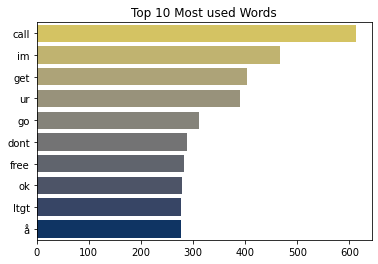

In [12]:
#plot most used words
sns.barplot(x=topvals,y=topkeys,palette="cividis_r").set(title='Top 10 Most used Words')

## Word Cloud

The most commonly used words in the dataset can also be visualized using a word cloud. A word cloud uses font size to convey which words occur most frequently. Word clouds are not the best way to convey which word was used most. It can be difficult to accurately compare the rank of a word based on its font size. They are more artistic than quantitative. The word cloud below was created with the Almeida et al. (2011) dataset. It’s supposed to be a can on spam. This code may take a minute to run based on its settings. Please include the "spam.jpg" file in the directory to create a color mask.


In [13]:
#create color mask
#https://amueller.github.io/word_cloud/auto_examples/a_new_hope.html
mask_coloring = np.array(Image.open("spam.jpg"))
image_colors = ImageColorGenerator(mask_coloring)

#create word cloud object from text
wc = WordCloud(background_color="white", max_font_size=48, width=2000, height=2000, max_words=2000, mask=mask_coloring).generate_from_frequencies(freq)

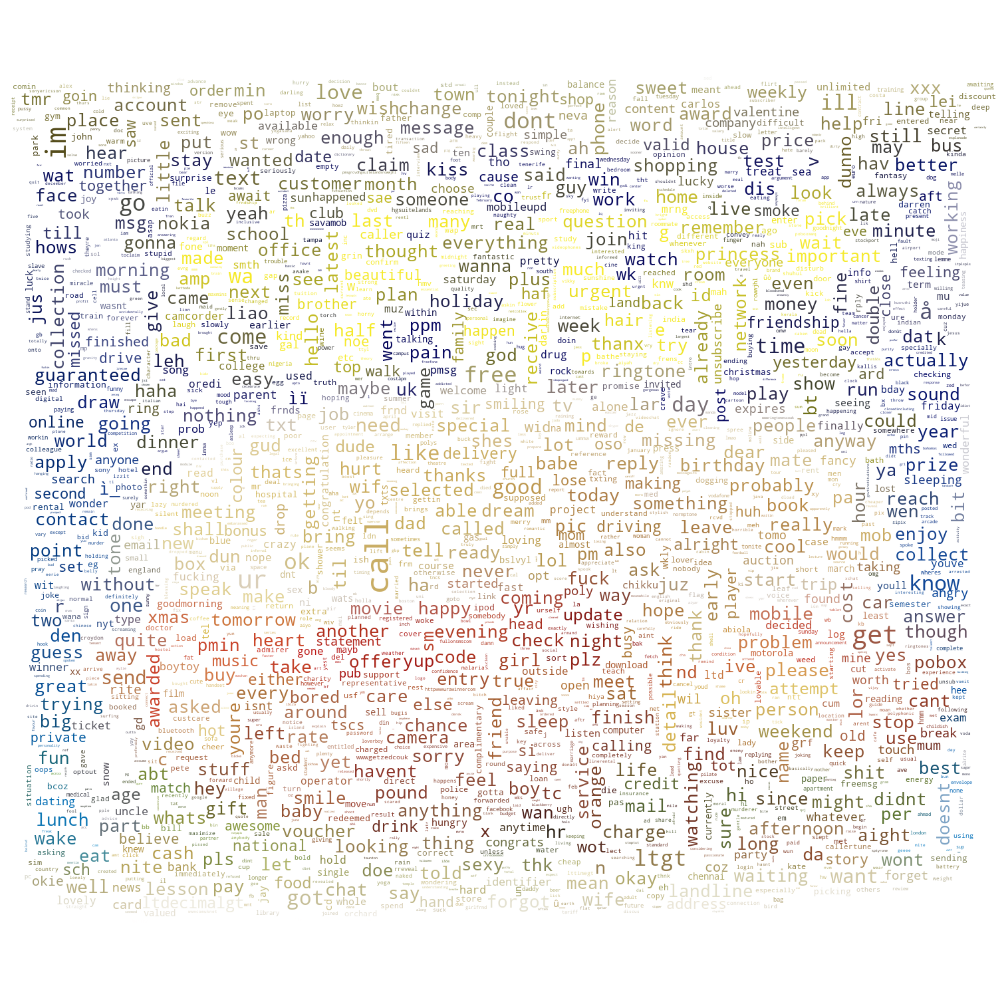

In [14]:
#plot word cloud object
plt.figure(figsize=(100, 100))
plt.imshow(wc.recolor(color_func=image_colors), interpolation='bilinear')
plt.axis('off')
#plt.savefig("output.jpg")
plt.show()

# Generate Feature Vector

The final text preparation step is to create a TF-IDF feature vector out of the cleaned text. This transforms a single text element in a vertical column into a sparse horizontal matrix where the importance of each word to the document is stored as a value in that matrix.

After the data is vectorized, it can be split into training and test sets. After division, it is then ready for analysis by a machine learning model. The vectorization code below has been taken from the MSDS680 week 3 lecture materials.


In [15]:
#MSDS680
#create TfidVectorizer to create the numerical values
vectorizer = TfidfVectorizer(stop_words="english",decode_error='ignore', lowercase = True, min_df=2)

#numericalize the textFeatures
features = vectorizer.fit_transform(spam_df['clean_text'].values.astype('U'))

#create the test and train datasets
features_train, features_test, labels_train, labels_test = train_test_split(features, spam_df['v1'], test_size=0.2, random_state=111)

# Creating a Naive Bayes Model

A multinomial Niave Bayes model will be created, fit, and scored all in one cell below.

In [27]:
#create model, fit model, and generate predictions
mnb = MultinomialNB(alpha=0.2)
mnb.fit(features_train, labels_train)
prediction = mnb.predict(features_test)
#generate comprehensive metrics
print(metrics.classification_report(labels_test, prediction,  digits=4))

              precision    recall  f1-score   support

           0     0.9897    0.9959    0.9928       967
           1     0.9718    0.9324    0.9517       148

    accuracy                         0.9874      1115
   macro avg     0.9808    0.9641    0.9723      1115
weighted avg     0.9873    0.9874    0.9873      1115



Confusion matrix, without normalization
[[963   4]
 [ 10 138]]


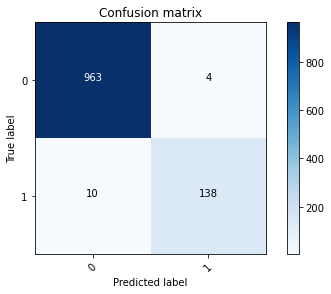

In [28]:
#define confusion matrix object, set true labels and preds 
cm = confusion_matrix(labels_test, prediction)

#plot confusion matrix
plt.figure()
class_names = ['0','1']
plot_confusion_matrix(cm, classes=class_names,
                      title='Confusion matrix')

plt.show()

# Model Discussion

## Accuracy 

The Naive Bayes achieves outstanding spam prediction scores. With a raw prediction accuracy of 98.7%, it is accurately identifying almost all of the spam and ham messages in the dataset.

## Confusion Matrix

Additional insight into the prediction of the model can be shown with a confusion matrix. The confusion matrix reveals that out of 1,115 samples, only 14 were predicted to have the wrong class label. The model's recall on predictions of ham is outstanding, only incorrectly labeling 4 of 967 messages with the wrong label acheiving a recall score of 99.59%. The model had more difficulty correctly labeling spam messages, incorrectly labeling 10 out of 148 spam messages for a recall score of 93.24%.


# Displaying Posterior Probability for Top Words in Each Class

The predict_proba() method will generate the posterior probabilities for a string using a trained Naive Bayes model. The predict_proba() method will be used to display the posterior probability for the 5 most frequently used words in each class. First, the dataframe is filtered to separate the text based on its class label. After the dataframe is split, the frequency of each word can be calculated for each class. Next, a Naive Bayes model is combined with a TfidVectorizer into a pipeline and trained on the dataset. The top 5 words for each class from the filtering operation can then be ran through the pipeline using the predict_proba() method to display their posterior probabilities. The posterior probabilities for the top 5 words from each class are shown below. <br>

<b>5 Most Frequent Spam Words w/ Posterior Probability</b>
1. 'call' __ 0.29802713263341035
2. 'å' __ 0.13439533318375593
3. 'free' __ 0.5226574611310594
4. 'txt' __ 0.7835285208996268
5. 'ur' __ 0.19035492713844224

<b>5 Most Frequent Ham Words w/ Posterior Probability</b>

1. 'im' __ 0.9877515018507407
2. 'get' __ 0.922964857261505
3. 'go' __ 0.9570067607445994
4. 'ltgt' __ 0.9979411075303782
5. 'ok' __ 0.9923432122118357


In [18]:
#MSDS600, MSDS650
#filter dataframe halves to seperate prediction variables
spam_only_df = spam_df.drop(spam_df[spam_df.v1 == 0].index)
ham_only_df = spam_df.drop(spam_df[spam_df.v1 == 1].index)

#create frequencey count for most used words
spam_only_freq = pd.Series(' '.join(spam_only_df.clean_text).split()).value_counts().to_dict()
ham_only_freq = pd.Series(' '.join(ham_only_df.clean_text).split()).value_counts().to_dict()

#create keys and values for visualization
spam_only_topkeys = list(spam_only_freq.keys())[:5]
spam_only_topvals = list(spam_only_freq.values())[:5]
ham_only_topkeys = list(ham_only_freq.keys())[:5]
ham_only_topvals = list(ham_only_freq.values())[:5]


[Text(0.5, 1.0, 'Top 5 Most Used Spam Words')]

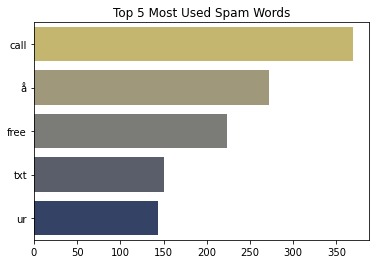

In [19]:
#plot most used words
sns.barplot(x=spam_only_topvals,y=spam_only_topkeys,palette="cividis_r").set(title='Top 5 Most Used Spam Words')

[Text(0.5, 1.0, 'Top 5 Most Used Ham Words')]

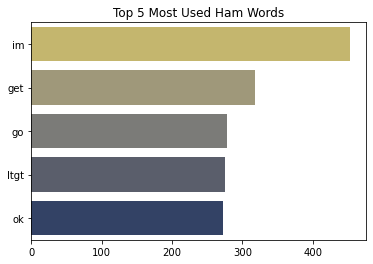

In [20]:
#plot most used words
sns.barplot(x=ham_only_topvals,y=ham_only_topkeys,palette="cividis_r").set(title='Top 5 Most Used Ham Words')

In [21]:
#create pipeline for predict_proba function
model = make_pipeline(TfidfVectorizer(), mnb)

In [22]:
#define train_test_split for pipeline
pipeline_features_train, pipeline_features_test, pipeline_labels_train, pipeline_labels_test = train_test_split(spam_df['clean_text'], spam_df['v1'], test_size=0.2, random_state=111)

In [23]:
#fit model pipeline, MSDS680
model.fit(pipeline_features_train, pipeline_labels_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('multinomialnb', MultinomialNB(alpha=0.2))])

In [24]:
#create predict_proba function, MSDS680
def predict_proba(s, train=spam_df, model=model):
    pred = model.predict_proba([s])
    return pred

In [25]:
#Create list of posterior probabilities for spam_only_keys
valuedict=[]
for blam in spam_only_topkeys:
    test = predict_proba(blam)
    valuedict.append(blam)
    valuedict.append(test[0,1])
print('The posterior probabilities for the most used words in the spam category are:')
print(valuedict)  

The posterior probabilities for the most used words in the spam category are:
['call', 0.29802713263341035, 'å', 0.13439533318375593, 'free', 0.5226574611310594, 'txt', 0.7835285208996268, 'ur', 0.19035492713844224]


In [26]:
#Create list of posterior probabilities for ham_only_keys
valuedict=[]
for blam in ham_only_topkeys:
    test = predict_proba(blam)
    valuedict.append(blam)
    valuedict.append(test[0,0])
print('The posterior probabilities for the most used words in the ham category are:')
print(valuedict)  

The posterior probabilities for the most used words in the ham category are:
['im', 0.9877515018507407, 'get', 0.922964857261505, 'go', 0.9570067607445994, 'ltgt', 0.9979411075303782, 'ok', 0.9923432122118357]


# Improving the Naive Bayes Model: Hyperparameter Tuning

The model is already performing well, achieving a prediction accuracy of 98.7% on its test set. It may be difficult to squeeze additional accuracy out of a model that performs at this level. The sci-kit learn literature suggests that the smoothing coefficient, denoted as the hyperparameter alpha, may be optimized to improve the performance of a Naive Bayes model. Smoothing allows the model to account for features not present in the dataset and prevents zero probabilities from effecting its calculations. A GridSearchCV will be conducted to brute-force check all tenth decimal place alpha values between 0 and 1.


In [27]:
## optimize alpha for MNB
params = {'alpha':[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
         }

opt = GridSearchCV(MultinomialNB(),params,scoring='accuracy')
opt.fit(features_train, labels_train)

C:\Users\adamg\anaconda3\lib\site-packages\sklearn\naive_bayes.py:591: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn(
C:\Users\adamg\anaconda3\lib\site-packages\sklearn\naive_bayes.py:591: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn(
C:\Users\adamg\anaconda3\lib\site-packages\sklearn\naive_bayes.py:591: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn(
C:\Users\adamg\anaconda3\lib\site-packages\sklearn\naive_bayes.py:591: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn(
C:\Users\adamg\anaconda3\lib\site-packages\sklearn\naive_bayes.py:591: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn(


GridSearchCV(estimator=MultinomialNB(),
             param_grid={'alpha': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                                   0.9, 1]},
             scoring='accuracy')

In [28]:
## display best hyperparameters
opt.best_estimator_

MultinomialNB(alpha=0.3)

In [29]:
#create model, fit model, and generate predictions
mnb = MultinomialNB(alpha=.3)
mnb.fit(features_train, labels_train)
prediction = mnb.predict(features_test)
#generate comprehensive metrics
print(metrics.classification_report(labels_test, prediction,  digits=4))

              precision    recall  f1-score   support

           0     0.9897    0.9959    0.9928       967
           1     0.9718    0.9324    0.9517       148

    accuracy                         0.9874      1115
   macro avg     0.9808    0.9641    0.9723      1115
weighted avg     0.9873    0.9874    0.9873      1115



Confusion matrix, without normalization
[[963   4]
 [ 10 138]]


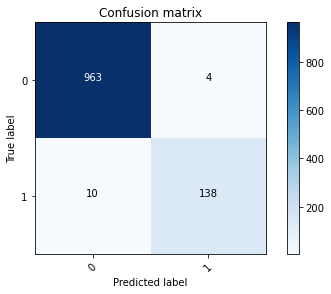

In [30]:
#define confusion matrix object, set true labels and preds 
cm = confusion_matrix(labels_test, prediction)

#plot confusion matrix
plt.figure()
class_names = ['0','1']
plot_confusion_matrix(cm, classes=class_names,
                      title='Confusion matrix')

plt.show()

# Gridsearch CV Discussion

The GridSearchCV recommended an alpha setting of 0.3, compared to 0.2 in the original model. Displaying the model's accuracy and confusion matrix with an alpha setting of 0.3 does not show any difference in the predictions that are made by the model with this setting of alpha. While it did not improve the model, hyperparameter tuning is a best practice that should always be employed when engaging in the design of a machine learning model.


# Discussion: How Could Additional Data Help the Model?

<b>Unseen Words</b><br>
It is difficult to improve on a model that achieves 98.7% accuracy on its task. Accuracy on the prescribed test set might not improve with additional data. With that in mind, the dataset this model was trained on is geographically biased (most messages are from Singaporean University students) and only contains about 3000 unique words. This is a relatively limited representation of the total number of words that are used in communication. If this model was put into production, it might encounter phrases from different parts of the world and word combinations outside of the 3000 it was trained on. Additional data that contains never before seen words from a wider geographic area would improve the model's ability to generalize on new streams of data.<br>

<b> Emojis</b><br>
SMS communication has changed since the days of T9 on cell phones. There are now a significant number of emoji's that are used in communication. This model has no comprehension of emojis. Being exposed to a dataset that includes emojis, and whatever other new communication trends develop, would improve the generalization of the model.<br>

<b> Suggestions for Improvement</b><br>
One way this could be done is to continually update the model’s database with samples of SMS that has been flagged by users as legitimate or spam. This would allow the model to continually refine its definition of spam and would include new communication types as they occur. Naive Bayes is agile enough to support large datasets and incorporate new information into its prediction. This practice would capture new trends in text communication such as emojis when the occur.




# References

This notebook was created using a blend of techniques from Regis's MSDS600, MSDS680, and MSDS650 coursework. In addition to this, the reference literature for sci-kit learn, pandas, and seaborn was consulted to construct the code.

Almeida, T.A., GÃ³mez Hidalgo, J.M., Yamakami, A. (2011). Contributions to the Study of SMS Spam Filtering: New Collection and Results. Proceedings of the 2011 ACM Symposium on Document Engineering (DOCENG'11), Mountain View, CA, USA

Pandas Development Team. 2021. <i>Python API reference</i> from pandas.pydata.org https://pandas.pydata.org/docs/reference/index.html

Pedregosa et al. (2011). Scikit-learn: Machine Learning in Python. <i> Journal of Machine Learning Research 12,</i> 2825-2830

Waskom ML (2021). seaborn: statistical data visualization. <i> Journal of Open Source Software 6</i>(60): 3021.a